# Computer Vision 2023 Assignment 2: Image matching and retrieval

In this prac, you will experiment with image feature detectors, descriptors and matching. There are 3 main parts to the prac:

- matching an object in a pair of images
- searching for an object in a collection of images
- analysis and discussion of results

## General instructions

As before, you will use this notebook to run your code and display your results and analysis. Again we will mark a PDF conversion of your notebook, referring to your code if necessary, so you should ensure your code output is formatted neatly.

***When converting to PDF, include the outputs and analysis only, not your code.*** You can do this from the command line using the `nbconvert` command (installed as part of Jupyter) as follows:

    jupyter nbconvert Assignment2.ipynb --to pdf --no-input --TagRemovePreprocessor.remove_cell_tags 'remove-cell'

This will also remove the preamble text from each question. It has been packaged into a small notebook you can run in colab, called notebooktopdf.ipynb


We will use the `OpenCV` library to complete the prac. It has several built in functions that will be useful. You are expected to consult documentation and use them appropriately.

As with the last assignment it is somewhat up to you how you answer each question. Ensure that the outputs and report are clear and easy to read so that the markers can rapidly assess what you have done, why, and how deep is your understanding. This includes:

- sizing, arranging and captioning image outputs appropriately
- explaining what you have done clearly and concisely
- clearly separating answers to each question

## Data

We have provided some example images for this assignment, available through a link on the MyUni assignment page. The images are organised by subject matter, with one folder containing images of book covers, one of museum exhibits, and another of urban landmarks. You should copy these data into a directory A2_smvs, keeping the directory structure the same as in the zip file.  

Within each category (within each folder), there is a “Reference” folder containing a clean image of each object and a “Query” folder containing images taken on a mobile device. Within each category, images with the same name contain the same object (so 001.jpg in the Reference folder contains the same book as 001.jpg in the Query folder).
The data is a subset of the Stanford Mobile Visual Search Dataset which is available at

<http://web.cs.wpi.edu/~claypool/mmsys-dataset/2011/stanford/index.html>.

The full data set contains more image categories and more query images of the objects we have provided, which may be useful for your testing!

Do not submit your own copy of the data or rename any files or folders! For marking, we will assume the datasets are available in subfolders of the working directory using the same folder names provided.

Here is some general setup code, which you can edit to suit your needs.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pwd
%cd drive/My\ Drive/cv_Assignment2
!pwd

/content
/content/drive/My Drive/cv_Assignment2
/content/drive/My Drive/cv_Assignment2


In [3]:
# Numpy is the main package for scientific computing with Python.
import numpy as np
import cv2

# Matplotlib is a useful plotting library for python
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots, can be changed
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [4]:
def draw_outline(ref, query, model, title):
    """
        Draw outline of reference image in the query image.
        This is just an example to show the steps involved.
        You can modify to suit your needs.
        Inputs:
            ref: reference image
            query: query image
            model: estimated transformation from query to reference image
    """
    h,w = ref.shape[:2]
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,model)

    img = query.copy()
    img = cv2.polylines(img,[np.int32(dst)],True,255,3, cv2.LINE_AA)
    plt.figure(figsize=(8,6))
    plt.title(title)
    plt.imshow(img, 'gray'), plt.show()

def draw_inliers(img1, img2, kp1, kp2, matches, matchesMask, title):
    """
        Draw inlier between images
        img1 / img2: reference/query  img
        kp1 / kp2: their keypoints
        matches : list of (good) matches after ratio test
        matchesMask: Inlier mask returned in cv2.findHomography()
    """
    matchesMask = matchesMask.ravel().tolist()
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,**draw_params)
    plt.figure(figsize=(8,6))
    plt.title(title)
    plt.imshow(img3, 'gray'),plt.show()


# Question 1: Matching an object in a pair of images (60%)


In this question, the aim is to accurately locate a reference object in a query image, for example:

![Books](book.png "Books")

0. Download and read through the paper [ORB: an efficient alternative to SIFT or SURF](https://www.researchgate.net/publication/221111151_ORB_an_efficient_alternative_to_SIFT_or_SURF) by Rublee et al. You don't need to understand all the details, but try to get an idea of how it works. ORB combines the FAST corner detector (covered in week 3) and the BRIEF descriptor. BRIEF is based on similar ideas to the SIFT descriptor we covered week 3, but with some changes for efficiency.

1. [Load images] Load the first (reference, query) image pair from the "book_covers" category using opencv (e.g. `img=cv2.imread()`). Check the parameter option in "
cv2.imread()" to ensure that you read the gray scale image, since it is necessary for computing ORB features.

2. [Detect features] Create opencv ORB feature extractor by `orb=cv2.ORB_create()`. Then you can detect keypoints by `kp = orb.detect(img,None)`, and compute descriptors by `kp, des = orb.compute(img, kp)`. You need to do this for each image, and then you can use `cv2.drawKeypoints()` for visualization.

3. [Match features] As ORB is a binary feature, you need to use HAMMING distance for matching, e.g., `bf = cv2.BFMatcher(cv2.NORM_HAMMING)`. Then you are requried to do KNN matching (k=2) by using `bf.knnMatch()`. After that, you are required to use "ratio_test" to find good matches. By default, you can set `ratio=0.8`.

4. [Plot and analyze] You need to visualize the matches by using the `cv2.drawMatches()` function. Also you can change the ratio values, parameters in `cv2.ORB_create()`, and distance functions in `cv2.BFMatcher()`. Please discuss how these changes influence the match numbers.


In [5]:
# load images as grey scale
img1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
if not np.shape(img1):
  # Error message and print current working dir
  print("Could not load img1. Check the path, filename and current working directory\n")
  !pwd
img2 = cv2.imread("A2_smvs/book_covers/Query/001.jpg", 0)
if not np.shape(img2):
  # Error message and print current working dir
  print("Could not load img2. Check the path, filename and current working directory\n")
  !pwd

In [6]:
# Your code for descriptor matching tests here
def descriptor_matching(reference_image, query_image, title, ratio=0.8, distance_fx=cv2.NORM_HAMMING):
# compute detector and descriptor, see (2) above
  reference_image = cv2.cvtColor(reference_image, cv2.COLOR_BGR2RGB)
  reference_image_gray = cv2.cvtColor(reference_image, cv2.COLOR_RGB2GRAY)
  query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
  query_image_gray = cv2.cvtColor(query_image, cv2.COLOR_RGB2GRAY)
# find the keypoints and descriptors with ORB, see (2) above
  orb = cv2.ORB_create()
# draw keypoints, see (2) above
  reference_kp, reference_descriptors = orb.detectAndCompute(reference_image_gray, None)
  query_kp, query_descriptors = orb.detectAndCompute(query_image_gray, None)
  kp_wo_size = np.copy(reference_image)
  kp_w_size = np.copy(reference_image)
  cv2.drawKeypoints(reference_image, reference_kp, kp_wo_size, color=(0,255,0))
  cv2.drawKeypoints(reference_image, reference_kp, kp_w_size, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# create BFMatcher object, see (3) above
  bf = cv2.BFMatcher(distance_fx)

# Match descriptors, see (3) above
  matches = bf.knnMatch(reference_descriptors, query_descriptors, k=2)

# Apply ratio test, see (3) above

  good = []
  for m,n in matches:
    if m.distance < ratio*n.distance:
      good.append(m)
  print(f'The number of good matches: {len(good)}')
# draw matches, see (4) above
  draw_params = dict(matchColor = (0,255,0), singlePointColor = (255,0,0), flags=cv2.DrawMatchesFlags_DEFAULT)
  output = cv2.drawMatches(reference_image, reference_kp, query_image, query_kp, good, None, **draw_params)
  plt.title(title)
  plt.imshow(output), plt.show()
  return reference_kp, query_kp, reference_descriptors, query_descriptors, matches, good

### Descriptor Matching

Descriptors are compact representations of local image regions that capture important visual information such as edges, corners, and texture. They are typically computed at keypoints or interest points in an image.

The goal of descriptor matching is to establish correspondences between keypoints in different images. By comparing the descriptors of keypoints in different images, we can determine if they represent the same visual feature or object. This information is valuable in various computer vision tasks, such as image stitching, object recognition, 3D reconstruction, and image retrieval.

The report demonstrates a function called descriptor_matching that performs matching of an object given in reference image to query image using the ORB (Oriented FAST and Rotated BRIEF) algorithm and the Brute-Force Matcher (BFMatcher) in OpenCV.

The function takes four parameters: reference_image and query_image are the input images to be matched, title is a string used as the title for the output image, and ratio is the ratio threshold used in the ratio test for filtering matches. The distance_fx parameter specifies the distance metric used by the BFMatcher, with cv2.NORM_HAMMING being the default.
* The first step is to convert the input images from BGR to RGB color space and then to grayscale. This is done using the cv2.cvtColor function.
* The next step is to create an ORB object using cv2.ORB_create(). ORB is a feature detection and descriptor extraction algorithm.
* The keypoint detection and descriptor computation are performed using the detectAndCompute method of the ORB object on the grayscale images. This step generates keypoint locations (reference_kp and query_kp) and their corresponding descriptors (reference_descriptors and query_descriptors) for both the reference and query images.
* The code then creates a BFMatcher object using cv2.BFMatcher(distance_fx). BFMatcher is a brute-force matching algorithm that compares each descriptor in the reference image with all descriptors in the query image.
* The descriptors of the reference and query images are matched using the knnMatch method of the BFMatcher. The k parameter is set to 2, which means that the two best matches for each descriptor are returned.
* After obtaining the matches, a ratio test is applied to filter out unreliable matches. For each match m, if its distance is less than ratio times the distance of the second-best match n, it is considered a good match and added to the good list.
* Finally, the function uses cv2.drawMatches to draw the good matches on the output image. The resulting image is displayed using plt.imshow and plt.show.

The function returns the keypoints, descriptors, matches, and good matches for further analysis if needed.

The number of good matches: 131


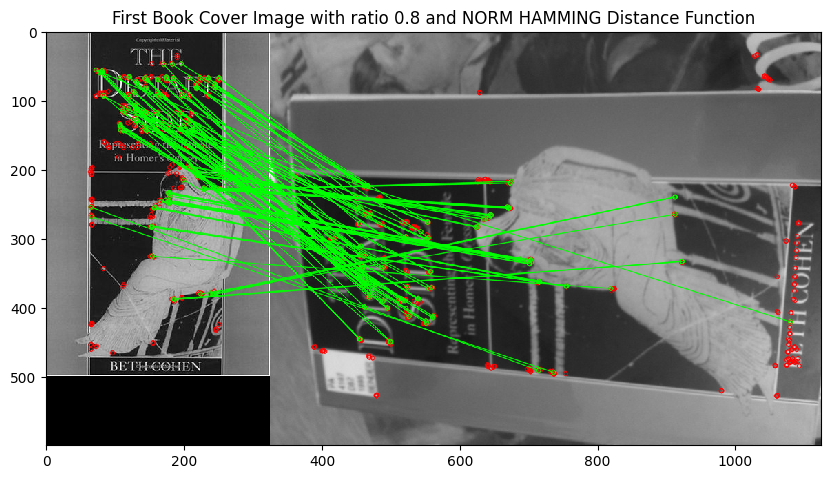

In [77]:
image1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
image2 = cv2.imread('A2_smvs/book_covers/Query/001.jpg', 0)
(reference_kp, query_kp, reference_descriptors, query_descriptors, matches, good) = descriptor_matching(image1, image2,'First Book Cover Image with ratio 0.8 and NORM HAMMING Distance Function')

The number of good matches: 19


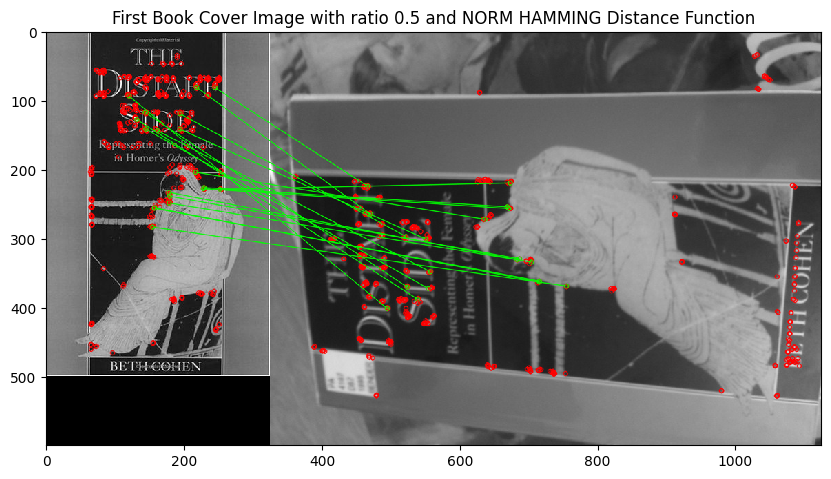

In [8]:
image1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
image2 = cv2.imread('A2_smvs/book_covers/Query/001.jpg', 0)
(reference_kp, query_kp, reference_descriptors, query_descriptors, matches, good) = descriptor_matching(image1, image2,'First Book Cover Image with ratio 0.5 and NORM HAMMING Distance Function',0.5)

The number of good matches: 469


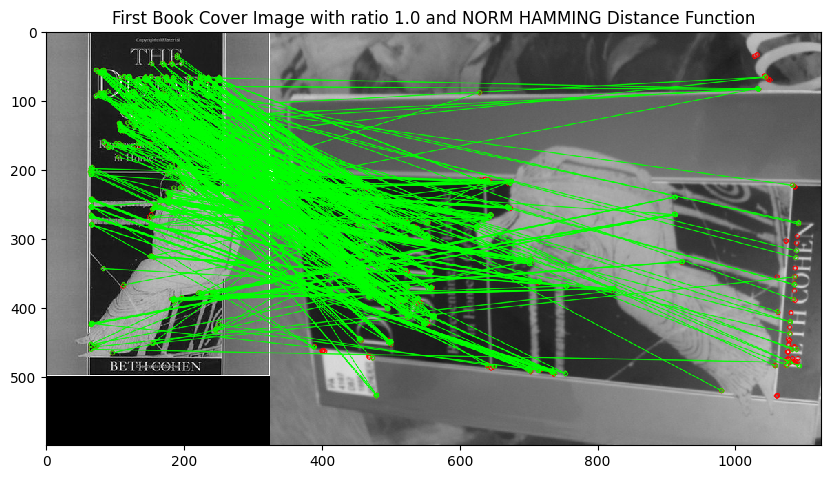

In [9]:
image1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
image2 = cv2.imread('A2_smvs/book_covers/Query/001.jpg', 0)
(reference_kp, query_kp, reference_descriptors, query_descriptors, matches, good) = descriptor_matching(image1, image2,'First Book Cover Image with ratio 1.0 and NORM HAMMING Distance Function',1.0)

##### Influence of Ratio in matching the keypoints

The ratio parameter is used in the ratio test to filter out unreliable matches. The ratio test compares the distance of the best match m with the distance of the second-best match n. If the distance of m is significantly smaller than ratio times the distance of n, then m is considered a good match and retained.
Thus, decreasing the ratio value makes the ratio test more stringent, allowing only closer matches to be considered good matches. This can help filter out potential false matches and improve the quality of the final matches. Whereas, increasing the value of ratio allow more matches to be considered as good matches and cause more false matches to be counted.
We can see the number of good matches for ratios 0.8, 0.5, 1.0 are 131, 19, 469 respectively.

The number of good matches: 51


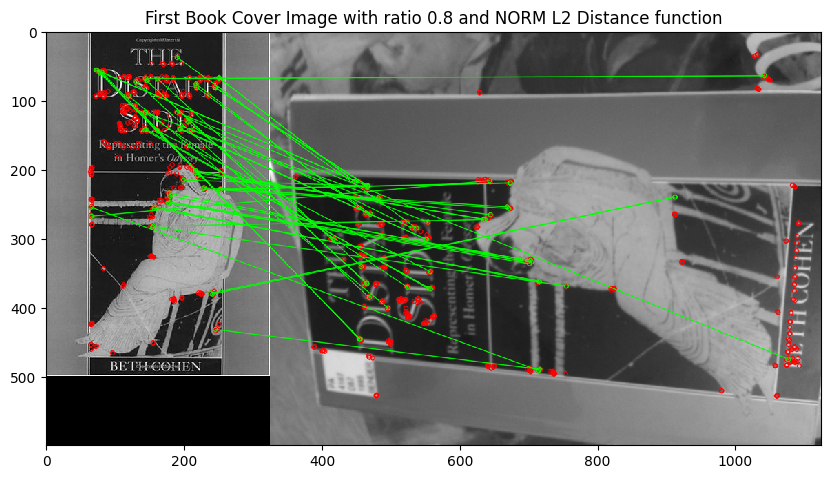

In [10]:
image1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
image2 = cv2.imread('A2_smvs/book_covers/Query/001.jpg', 0)
(reference_kp, query_kp, reference_descriptors, query_descriptors, matches, good) = descriptor_matching(image1, image2,'First Book Cover Image with ratio 0.8 and NORM L2 Distance function',0.8,cv2.NORM_L2)

The number of good matches: 94


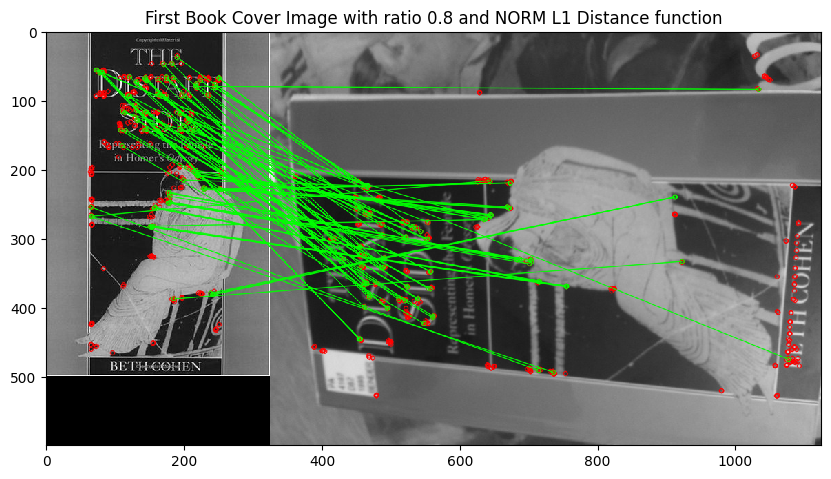

In [11]:
image1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
image2 = cv2.imread('A2_smvs/book_covers/Query/001.jpg', 0)
(reference_kp, query_kp, reference_descriptors, query_descriptors, matches, good) = descriptor_matching(image1, image2,'First Book Cover Image with ratio 0.8 and NORM L1 Distance function',0.8,cv2.NORM_L1)

The number of good matches: 109


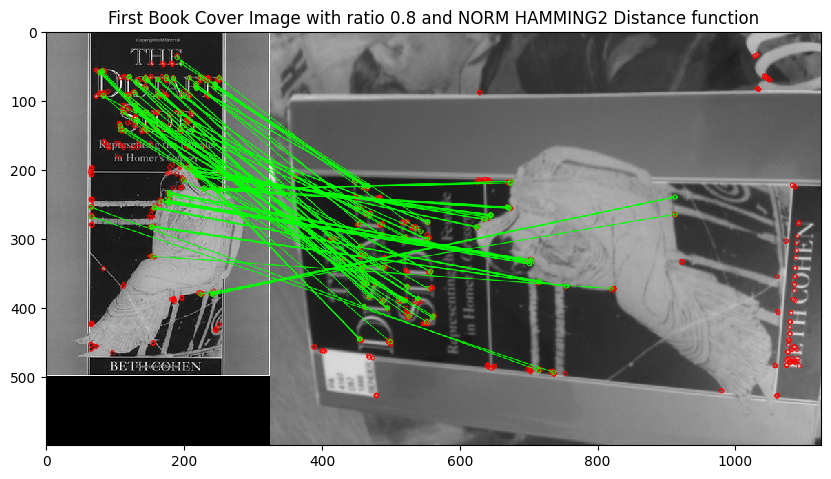

In [12]:
image1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
image2 = cv2.imread('A2_smvs/book_covers/Query/001.jpg', 0)
(reference_kp, query_kp, reference_descriptors, query_descriptors, matches, good) = descriptor_matching(image1, image2,'First Book Cover Image with ratio 0.8 and NORM HAMMING2 Distance function',0.8,cv2.NORM_HAMMING2)

#### **Influence of Distance Function in matching the keypoints**

It is a function used by BFMatcher while matching descriptors. In the provided code, the default distance metric used is cv2.NORM_HAMMING, which is appropriate for binary descriptors such as those generated by the ORB algorithm.
Distance function have different characteristics and are suitable for different descriptor types. Changing the distance function can have an impact on the matching results. It's important to choose a distance function that is appropriate for the descriptors being used and the specific requirements of the task. In this example, we can see that cv2.NORM_L1 and cv2.NORM_L2 are not suitable in comparison to cv2.NORM_HAMMING because we can see the misclassified key points in both the images. Additionally, the number of good matches for constant ratio of 0.8 and various distances are as follows

| Distance Function   | Number of Good matches |
|-------------------|-------|
| cv2.NORM_HAMMING  | 131   |
| cv2.NORM_L2       | 51    |
| cv2.NORM_L1       | 94    |
| cv2.NORM_HAMMING2 | 109   |

Thus, cv2.NORM_HAMMING distance function works best in this case.

3. Estimate a homography transformation based on the matches, using `cv2.findHomography()`. Display the transformed outline of the first reference book cover image on the query image, to see how well they match.

    - We provide a function `draw_outline()` to help with the display, but you may need to edit it for your needs.
    - Try the 'least squre method' option to compute homography, and visualize the inliers by using `cv2.drawMatches()`. Explain your results.
    - Again, you don't need to compare results numerically at this stage. Comment on what you observe visually.

In [13]:
def homography_transformation_leastSquare(reference_image, query_image, reference_kp,
                                          query_kp, good_keypoints, outline_title, inliers_title):
  # Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
  ref_kp = np.float32([reference_kp[m.queryIdx].pt for m in good_keypoints]).reshape(-1,1,2)
  q_kp = np.float32([query_kp[m.trainIdx].pt for m in good_keypoints]).reshape(-1,1,2)

  # using cv2 standard method, see (3) above
  Model, mask = cv2.findHomography(ref_kp, q_kp)
  # draw frame
  draw_outline(reference_image, query_image, Model, outline_title)
  # draw inliers

  draw_inliers(reference_image, query_image, reference_kp, query_kp, good_keypoints, mask, inliers_title)
  return print(f"The inlier number in least square homography transformation is: {len(mask)}")

### Homography Transformation using Matches

Homography transformation is a technique used in computer vision to map points in one image to corresponding points in another image. Homography transformation is commonly used in applications such as object detection, image stitching, and augmented reality.

The provided code contains the function `homography_transformation_leastSquare` and `homography_transformation_RANSAC` that demonstrates the process of performing homography transformation using a least-squares method and RANSAC method respectively based on matches between keypoints in the reference image and the query image that we got from the above `descriptor_matching` function. Let's break down the code step by step:
* The function takes several parameters: reference_image and query_image are the input images, reference_kp and query_kp are the keypoints in the reference and query images, good_keypoints is a list of good matches between the keypoints, outline_title is the title for the output image showing the frame, and inliers_title is the title for the output image showing the inliers.
* The next step is to prepare the keypoints for input to the cv2.findHomography function. The keypoints from the reference image and query image are extracted for the good matches using list comprehensions. The keypoints are then converted to a float32 array and reshaped to the format expected by cv2.findHomography. The ref_kp array contains the keypoints from the reference image, and q_kp contains the keypoints from the query image.
* The cv2.findHomography function is called with the ref_kp and q_kp arrays as inputs and appropriate methods, least square or RANSAC. It estimates the homography matrix (Model/ransac_Model) that maps points from the reference image to the query image based on the provided keypoints. The function also returns a mask (mask/ransac_mask) that indicates which matches are considered inliers and outliers.
* The code calls the draw_outline function to draw the frame on the output images. This function takes the reference image, query image, and the homography matrix (Model/ransac_Model) as inputs. It overlays the outline of the reference image onto the query image, visualizing the transformation.
* The draw_inliers function is called to draw the inliers on the output images. This function takes the reference image, query image, keypoints from both images, the good matches, the mask of inliers, and the title for the output image as inputs. It draws lines between the matched keypoints that are classified as inliers based on the mask.
* Finally, the function prints the number of inliers found during the least-squares homography transformation using the len() function.

In summary, the provided code performs homography transformation using a least-squares method based on matches between keypoints in the reference image and the query image. It estimates the homography matrix, visualizes the frame and inliers, and provides the number of inliers obtained.


Sample code for finding the Homography Transformation of First Book cover Image using Least Square Method

`homography_transformation_leastSquare(image1, image2, reference_kp, query_kp, good,
                                      'Homography Transformation of First Book cover Image using Least Square Method',
                                      'Inliers of First Book cover Image using Least Square Method')`

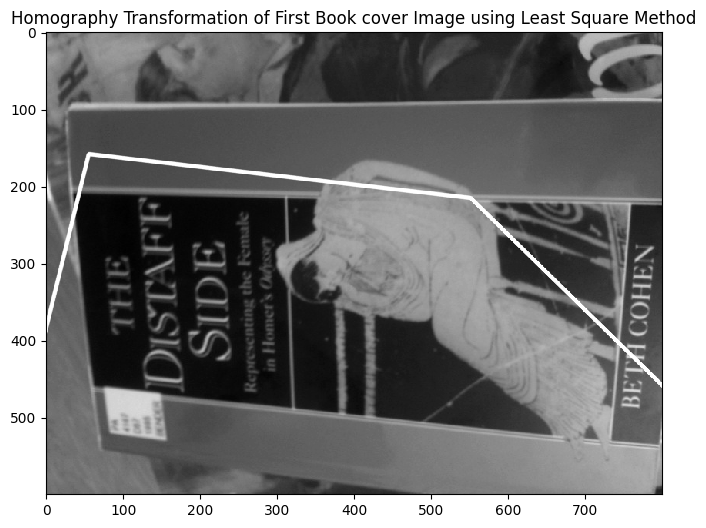

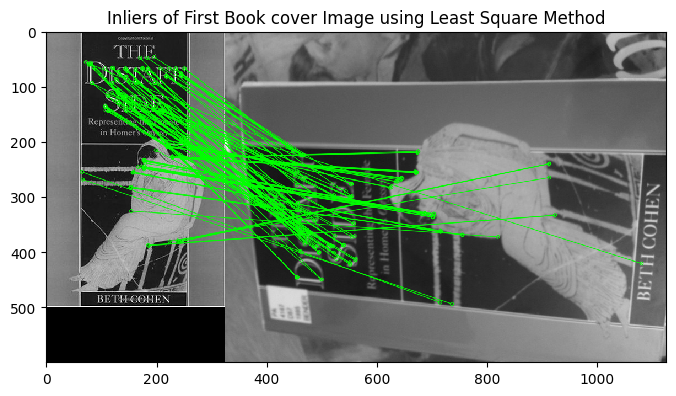

The inlier number in least square homography transformation is: 131


In [78]:
homography_transformation_leastSquare(image1, image2, reference_kp, query_kp, good,
                                      'Homography Transformation of First Book cover Image using Least Square Method',
                                      'Inliers of First Book cover Image using Least Square Method')

#### Explaination of results
The least squares method and the RANSAC (Random Sample Consensus) method are two common approaches used for estimating the homography transformation between two images based on matches between keypoints.

The least squares method aims to find the homography matrix that minimizes the overall error between the matched keypoints in the reference and query images. It formulates the problem as an optimization task and uses mathematical techniques to find the best-fitting homography matrix. The least-squares method provides a precise estimation of the homography but assumes that the majority of matches are correct. It can be sensitive to outliers and may be affected by incorrect matches.
As we can see in the image above, the number of inliers are 131. Despite the high amount of inliers, the algorithm cannot outline the boundary of the book in the query image.

Try the RANSAC option to compute homography. Change the RANSAC parameters, and explain your results. Print and analyze the inlier numbers.

#### Breif about RANSAC
The RANSAC method is an iterative algorithm that robustly estimates the homography matrix by handling outliers in the match set. It randomly selects a subset of matches (a minimal sample) and computes the homography matrix based on these matches. The algorithm then evaluates the number of inliers (matches consistent with the estimated model) by comparing the remaining matches to the estimated model. This process is repeated multiple times, and the best model (with the highest number of inliers) is selected as the final homography estimation. The RANSAC method is more robust to outliers and can handle a larger percentage of incorrect matches.

In [15]:
def homography_transformation_RANSAC(reference_image, query_image, reference_kp, query_kp, good_keypoints, outline_title, inliers_title):
# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
  ref_kp = np.float32([reference_kp[m.queryIdx].pt for m in good_keypoints]).reshape(-1,1,2)
  q_kp = np.float32([query_kp[m.trainIdx].pt for m in good_keypoints]).reshape(-1,1,2)

  # using RANSAC
  if len(good_keypoints)>4:
    ransac_Model, ransac_mask = cv2.findHomography(ref_kp, q_kp, cv2.RANSAC, 5.0)
  else:
    return print('Not enough matches for performing Homography Transformation')
  # draw frame
  draw_outline(reference_image, query_image, ransac_Model, outline_title)
  # draw inliers
  draw_inliers(reference_image, query_image, reference_kp, query_kp, good_keypoints, ransac_mask, inliers_title)
  # inlier number
  return print(f"The inlier number in RANSAC homography transformation is: {len(ransac_mask)}")

Sample code to display book location after applying RANSAC

`homography_transformation_RANSAC(image1, image2, reference_kp, query_kp, good,
                                 'Homography Transformation of First Book cover Image using RANSAC',
                                 'Inliers of First Book cover Image using RANSAC')`

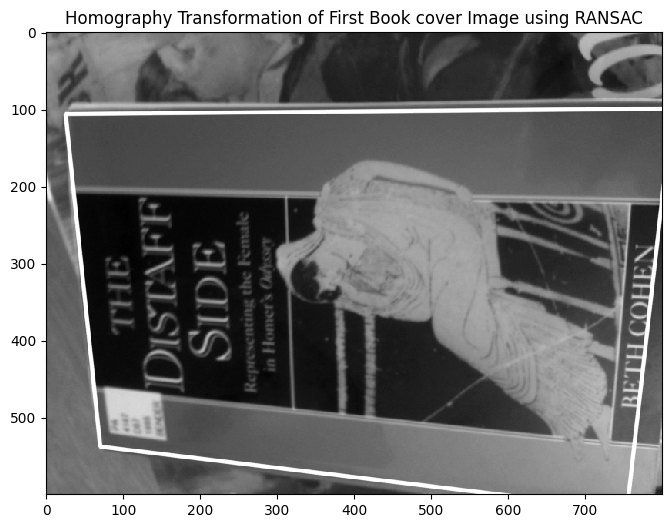

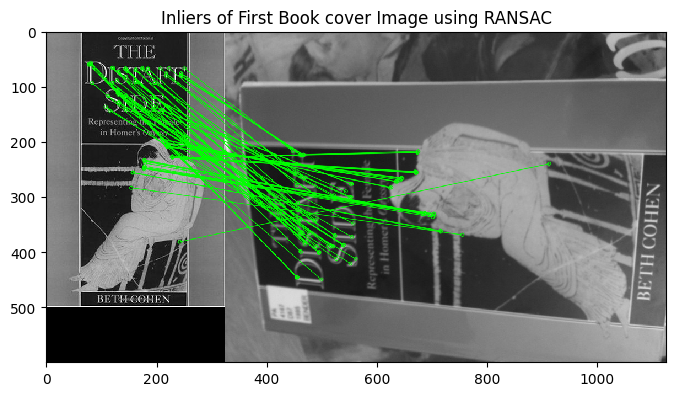

The inlier number in RANSAC homography transformation is: 109


In [16]:
# Your code to display book location after RANSAC here
homography_transformation_RANSAC(image1, image2, reference_kp, query_kp, good,
                                 'Homography Transformation of First Book cover Image using RANSAC',
                                 'Inliers of First Book cover Image using RANSAC')

#### Explaination

We tried to implement homography transformation of first book cover image using least square method and RANSAC method. Consequently, the RANSAC method is often better when dealing with real-world data that may contain outliers or incorrect matches. It provides robustness against outliers and tends to give more reliable results in the presence of noise or incorrect correspondences. The least square method could not properly fit the outline properly whereas the RANSAC method can fit the outline quite clearly in the given image.

6. Finally, try matching several different image pairs from the data provided, including at least one success and one failure case. For the failure case, test and explain what step in the feature matching has failed, and try to improve it. Display and discuss your findings.
    1. Hint 1: In general, the book covers should be the easiest to match, while the landmarks are the hardest.
    2. Hint 2: Explain why you chose each example shown, and what parameter settings were used.
    3. Hint 3: Possible failure points include the feature detector, the feature descriptor, the matching strategy, or a combination of these.

The number of good matches: 93


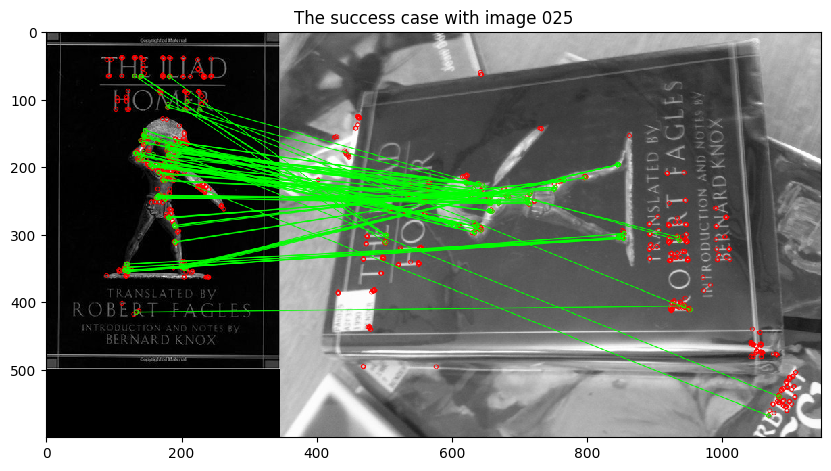

In [17]:
 # Your results for other image pairs here
reference_image = cv2.imread('A2_smvs/book_covers/Reference/025.jpg', 0)
query_image = cv2.imread('A2_smvs/book_covers/Query/025.jpg', 0)
reference_kp, query_kp, reference_descriptors, query_descriptors, matches, good = descriptor_matching(reference_image, query_image, 'The success case with image 025')
# homography_transformation_leastSquare(reference_image, query_image, reference_kp, query_kp, good,'Homography Transformation of image 025', 'Inliers of image 025')


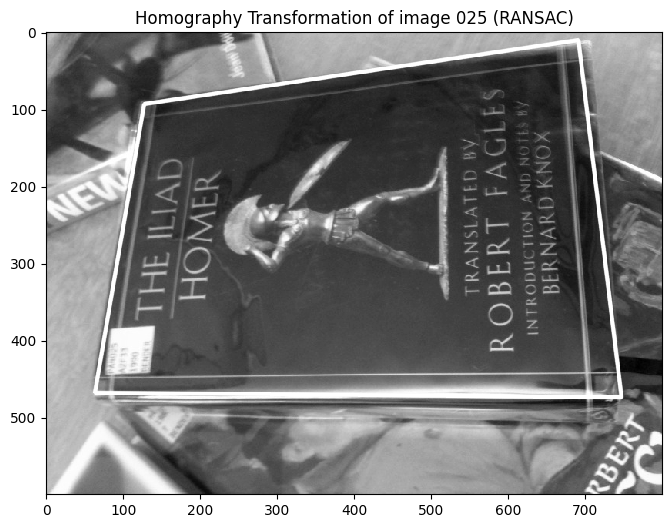

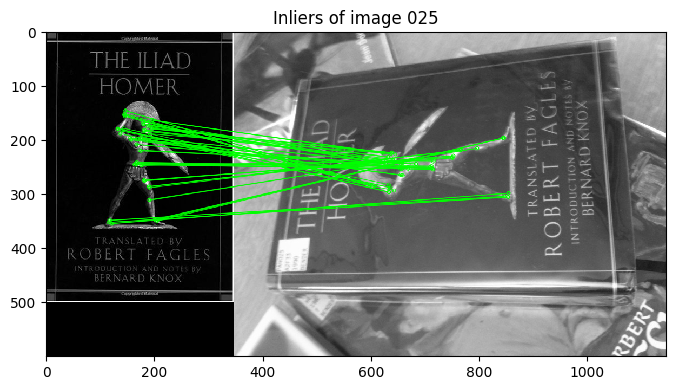

The inlier number in RANSAC homography transformation is: 93


In [18]:
homography_transformation_RANSAC(reference_image, query_image, reference_kp, query_kp, good, 'Homography Transformation of image 025 (RANSAC)', 'Inliers of image 025')

The number of good matches: 11


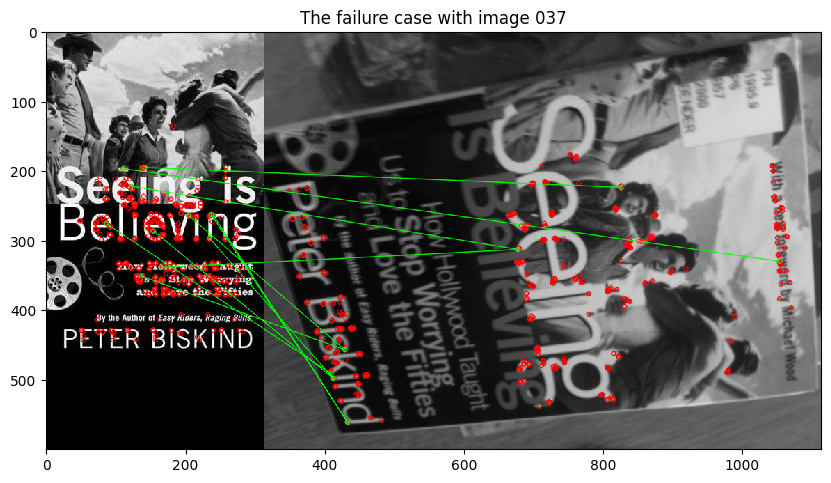

In [19]:
 # Your results for other image pairs here
reference_image = cv2.imread('A2_smvs/book_covers/Reference/037.jpg', 0)
query_image = cv2.imread('A2_smvs/book_covers/Query/037.jpg', 0)
reference_kp, query_kp, reference_descriptors, query_descriptors, matches, good = descriptor_matching(reference_image, query_image, 'The failure case with image 037')
# homography_transformation_leastSquare(reference_image, query_image, reference_kp, query_kp, good,'Homography Transformation of image 025', 'Inliers of image 025')


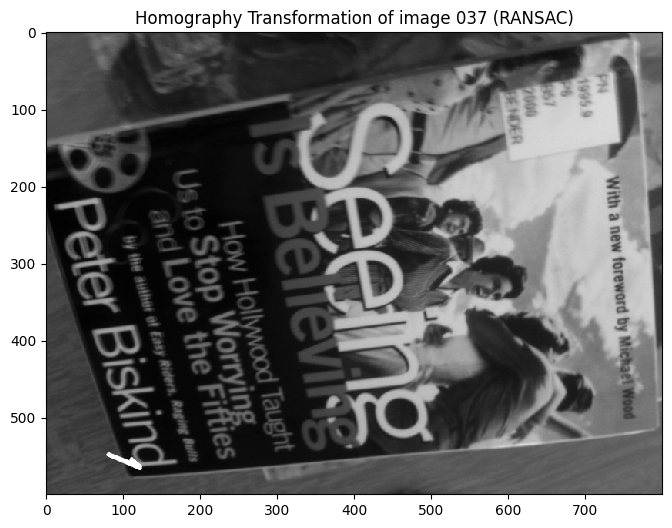

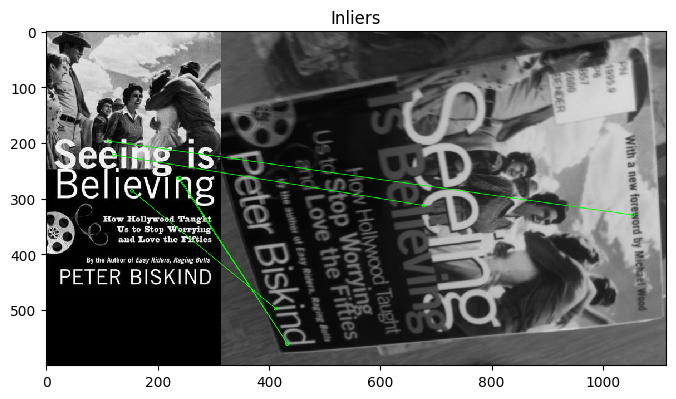

The inlier number in RANSAC homography transformation is: 11


In [20]:
homography_transformation_RANSAC(reference_image, query_image, reference_kp, query_kp, good, 'Homography Transformation of image 037 (RANSAC)', 'Inliers')

The number of good matches: 3


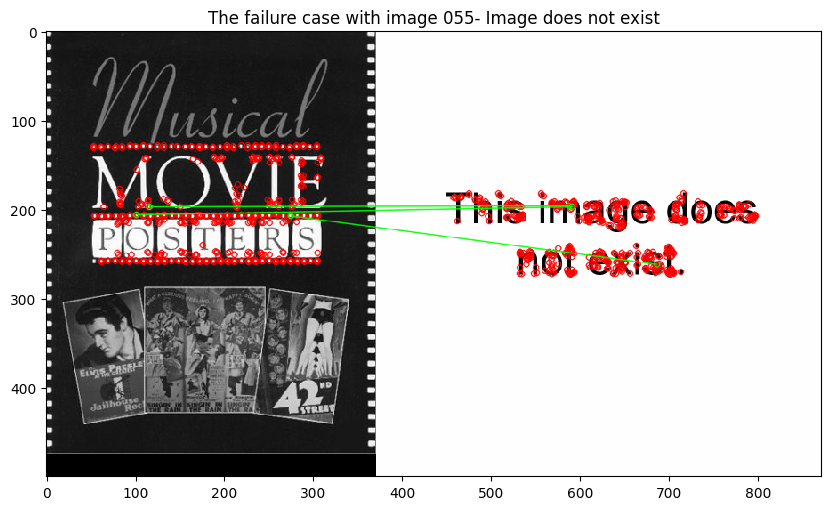

Not enough matches for performing Homography Transformation


In [21]:
 # Your results for other image pairs here
reference_image = cv2.imread('A2_smvs/book_covers/Reference/055.jpg', 0)
query_image = cv2.imread('A2_smvs/book_covers/Query/055.jpg', 0)
reference_kp, query_kp, reference_descriptors, query_descriptors, matches, good = descriptor_matching(reference_image, query_image, 'The failure case with image 055- Image does not exist')
# homography_transformation_leastSquare(reference_image, query_image, reference_kp, query_kp, good,'Homography Transformation of image 025', 'Inliers of image 025')
homography_transformation_RANSAC(reference_image, query_image, reference_kp, query_kp, good, 'Homography Transformation of image 055 (RANSAC)', 'Inliers of image 055')

#### Explaination of results

In summary, the code performs descriptor matching and homography transformation using RANSAC for two image pairs (025 and 037). It successfully displays the results for these pairs.

The image 025 is a success case where homography transformation using RANSAC can successfully draw the outline of the image with a fairly high number of inliers.

The image 037 is a failure case where homography transformation using RANSAC cannot successfully draw the outline of the image with a low number of inliers. It can happen due to difference in the scale of the images, blurring of the query image and rotation of the image.

However, it encounters an error for the third image pair (055) due to the non-existence of the query image. The images are very distinct with each other and the algorithm could not find even 4 matches to continue to the homography transformation and thus it gives the dialog box saying not enough matches for performing Homography Transformation.

# Question 2: What am I looking at? (40%)


<!--One application of feature matching is image retrieval. The goal of image retrieval is, given a query image of an object, to find all images in a database containing the same object, and return the results in ranked order (like a Google search). This is a huge research area but we will implement a very basic version of the problem based on the small dataset provided.-->

In this question, the aim is to identify an "unknown" object depicted in a query image, by matching it to multiple reference images, and selecting the highest scoring match. Since we only have one reference image per object, there is at most one correct answer. This is useful for example if you want to automatically identify a book from a picture of its cover, or a painting or a geographic location from an unlabelled photograph of it.

The steps are as follows:

1. Select a set of reference images and their corresponding query images.

    1. Hint 1: Start with the book covers, or just a subset of them.
    3. Hing 2: This question can require a lot of computation to run from start to finish, so cache intermediate results (e.g. feature descriptors) where you can.
    
2. Choose one query image corresponding to one of your reference images. Use RANSAC to match your query image to each reference image, and count the number of inlier matches found in each case. This will be the matching score for that image.

3. Identify the query object. This is the identity of the reference image with the highest match score, or "not in dataset" if the maximum score is below a threshold.

4. Repeat steps 2-3 for every query image and report the overall accuracy of your method (that is, the percentage of query images that were correctly matched in the dataset). Discussion of results should include both overall accuracy and individual failure cases.

    1. Hint 1: In case of failure, what ranking did the actual match receive? If we used a "top-k" accuracy measure, where a match is considered correct if it appears in the top k match scores, would that change the result?

<!--Code to implement this algorithm should mostly be written in a supporting file such as a2code.py. Call your code and display outputs in the notebook below.-->


In [22]:
def image_matching(query_image, path_list_of_ref_image, category, threshold):
  query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
  query_image_gray = cv2.cvtColor(query_image, cv2.COLOR_RGB2GRAY)
  orb = cv2.ORB_create()
  # draw keypoints, see (2) above
  query_kp, query_descriptors = orb.detectAndCompute(query_image_gray, None)
  list_num_inliers = []
  for ele in path_list_of_ref_image:
    path = os.path.join('A2_smvs/',category,'Reference',ele)
    reference_image = cv2.imread(path)
    reference_image = cv2.cvtColor(reference_image, cv2.COLOR_BGR2RGB)
    reference_image_gray = cv2.cvtColor(reference_image, cv2.COLOR_RGB2GRAY)
    reference_kp, reference_descriptors = orb.detectAndCompute(reference_image_gray, None)
    # create BFMatcher object, see (3) above
    bf = cv2.BFMatcher(cv2.NORM_HAMMING)

    # Match descriptors, see (3) above
    matches = bf.knnMatch(reference_descriptors, query_descriptors, k=2)
    MIN_MATCH_COUNT = 5
    # Apply ratio test, see (3) above
    ratio = 0.8
    good = []
    for m,n in matches:
      if m.distance < ratio*n.distance:
        good.append(m)
    if len(good)>MIN_MATCH_COUNT:
      ref_kp = np.float32([reference_kp[m.queryIdx].pt for m in good]).reshape(-1,1,2)
      q_kp = np.float32([query_kp[m.trainIdx].pt for m in good]).reshape(-1,1,2)
      ransac_Model, ransac_mask = cv2.findHomography(ref_kp, q_kp, cv2.RANSAC, 5.0)
      list_num_inliers.append(len(ransac_mask))
    else:
      list_num_inliers.append(0)

  # finding maximum score
  max_score = np.array(list_num_inliers).max()
  if max_score < threshold:
    return "Image is not in dataset"
  max_inlier_index = np.array(list_num_inliers).argmax()
  path = os.path.join('A2_smvs/',category,'Reference',path_list_of_ref_image[max_inlier_index])
  reference_image = cv2.imread(path)
  reference_image = cv2.cvtColor(reference_image, cv2.COLOR_BGR2RGB)
  # reference_image_gray = cv2.cvtColor(reference_image, cv2.COLOR_RGB2GRAY)
  # reference_kp, reference_descriptors = orb.detectAndCompute(reference_image_gray, None)
  # bf = cv2.BFMatcher(cv2.NORM_HAMMING)

  # # Match descriptors, see (3) above
  # matches = bf.knnMatch(reference_descriptors, query_descriptors, k=2)

  # # Apply ratio test, see (3) above
  # ratio = 0.8
  # good = []
  # for m,n in matches:
  #   if m.distance < ratio*n.distance:
  #     good.append(m)

  # homography_transformation_RANSAC(reference_image, query_image, reference_kp, query_kp, good)
  fig, plots = plt.subplots(1,2,figsize=(10,5))
  plots[0].set_title('Query Image')
  plots[0].imshow(query_image)
  plots[1].set_title('Matched Reference Image')
  plots[1].imshow(reference_image)

In [23]:
# Your code to iddntify query objects and measure search accuracy for data set here
import os
listofbookcovers = os.listdir('A2_smvs/book_covers/Reference')
listofbookcovers.sort()
listoflandmarks = os.listdir('A2_smvs/landmarks/Reference')
listoflandmarks.sort()
listofmuseumpaintings = os.listdir('A2_smvs/museum_paintings/Reference')
listofmuseumpaintings.sort()

### Approach of the question 2
In this question, we are trying to perform image retrieval where the aim is to identify an "unknown" object depicted in a query image, by matching it to multiple reference images, and selecting the highest scoring match. The code contains the function `image_matching` that performs image matching between a query image and a list of reference images. Let's go through the code step by step:

The function takes input of the query image, list of filenames to search from, category of the image (Book cover, museum painting and landmarks) and the threshold value below which the function cannot match any image and outputs "Image not in the dataset"

* The query image is converted from BGR to RGB color space. Then, it is converted to grayscale using cv2.cvtColor.
* The ORB (Oriented FAST and Rotated BRIEF) detector and descriptor are created using cv2.ORB_create.
* Keypoints and descriptors are computed for the query image using the ORB algorithm with orb.detectAndCompute and **saved as cache for matching with reference images.**
* A loop is iterated over the list of reference image paths.
* Inside the loop, each reference image is loaded and preprocessed similarly to the query image (color space conversion and grayscale conversion).
* Keypoints and descriptors are computed for the reference image using the ORB algorithm.
* A brute-force matcher (cv2.BFMatcher) is created using the Hamming distance metric.
* Descriptors of the reference image and the query image are matched using bf.knnMatch.
* A ratio test is applied to filter out good matches based on the distance ratio criterion.
* If the number of good matches exceeds a minimum threshold count (MIN_MATCH_COUNT), RANSAC (Random Sample Consensus) is applied to estimate the homography transformation between the reference image and the query image. The number of inliers is stored in list_num_inliers.

* If the number of inliers is below the specified threshold, the function returns "Image is not in dataset".
* The reference image with the maximum number of inliers is selected and loaded from the list of reference images.
* The selected reference image and the query image are displayed side by side using plt.subplots.

In summary, the code performs image matching between a query image and a list of reference images using the ORB algorithm. It applies a ratio test to filter out good matches and uses RANSAC to estimate the homography transformation between the matched images. The function returns the best-matched reference image and displays it along with the query image.


#### Making the list of file names under the reference folder for all the categories.

We made three lists, listofbookcovers, listoflandmarks, and listofmuseumpaintings. Each list is populated with the filenames of the corresponding reference images present in the respective directories. We can pass these lists directly to the function for the matching.

#### Book Covers Example

Success Cases

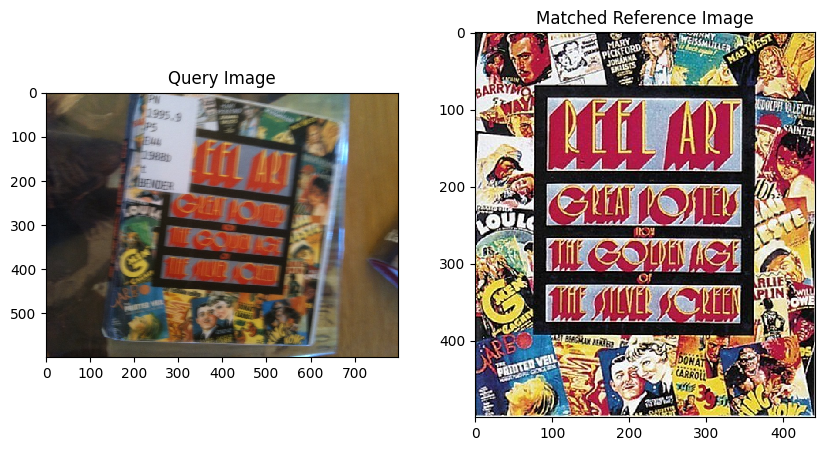

In [29]:
query_image = cv2.imread('A2_smvs/book_covers/Query/050.jpg')
image_matching(query_image, listofbookcovers,'book_covers', 30)

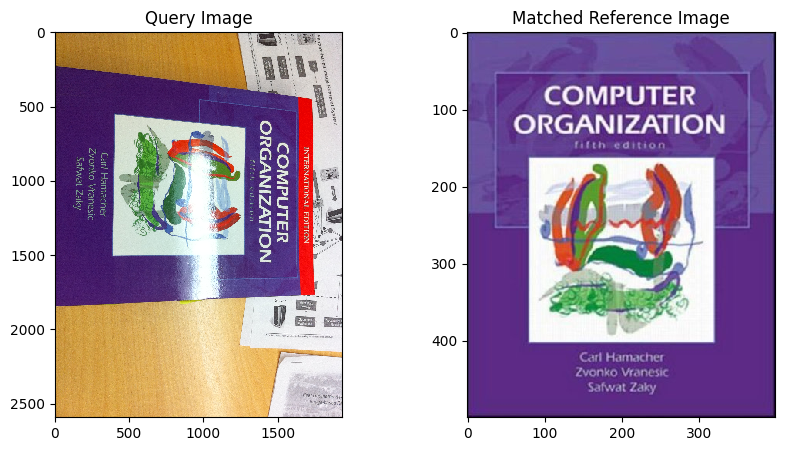

In [30]:
query_image = cv2.imread('A2_smvs/book_covers/Query/085.jpg')
image_matching(query_image, listofbookcovers,'book_covers', 30)

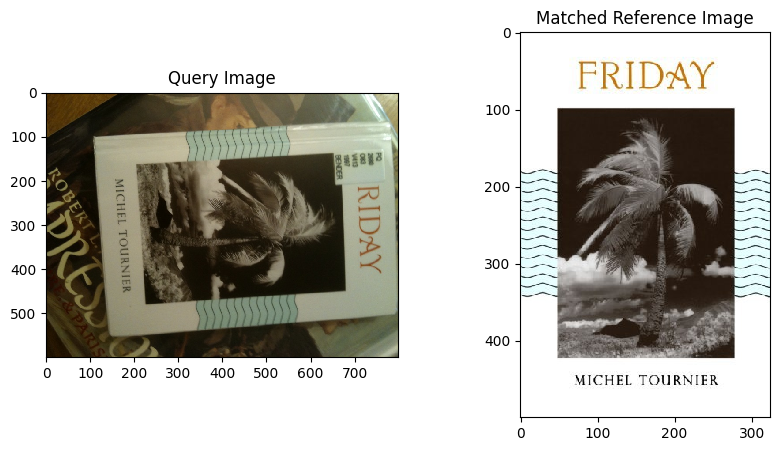

In [31]:
query_image = cv2.imread('A2_smvs/book_covers/Query/035.jpg')
image_matching(query_image, listofbookcovers,'book_covers', 30)

Failure Cases

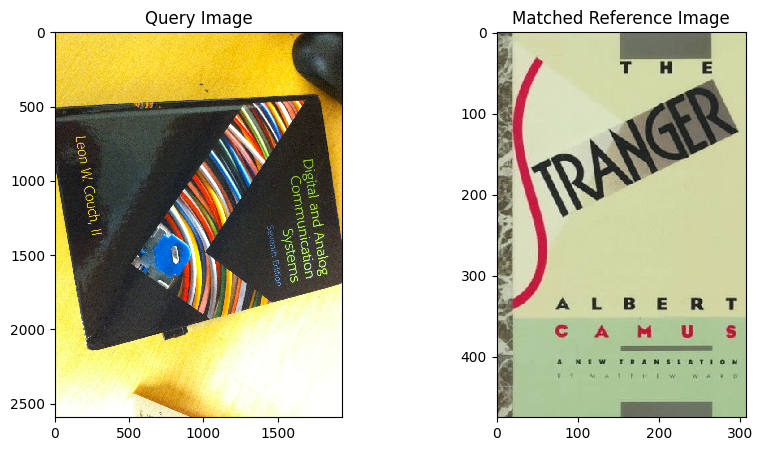

In [32]:
query_image = cv2.imread('A2_smvs/book_covers/Query/064.jpg')
image_matching(query_image, listofbookcovers,'book_covers', 30)

`query_image = cv2.imread('A2_smvs/book_covers/Query/069.jpg')
image_matching(query_image, listofbookcovers,'book_covers', 30)`

In [33]:
query_image = cv2.imread('A2_smvs/book_covers/Query/069.jpg')
image_matching(query_image, listofbookcovers,'book_covers', 30)

'Image is not in dataset'

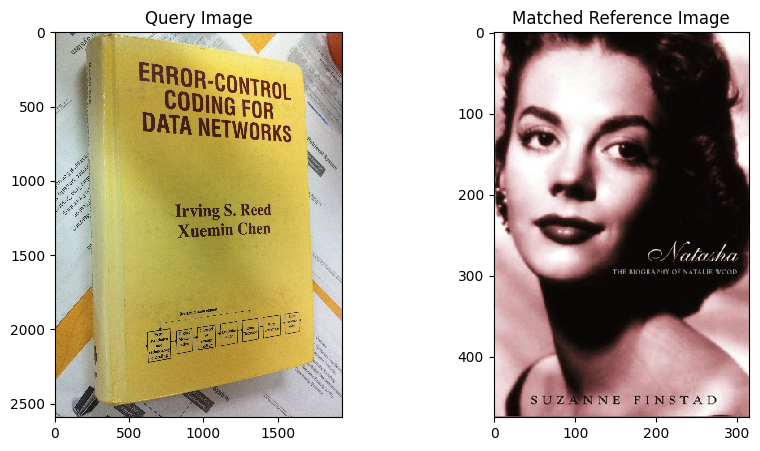

In [35]:
query_image = cv2.imread('A2_smvs/book_covers/Query/076.jpg')
image_matching(query_image, listofbookcovers,'book_covers', 30)

#### Landmarks Example

Success Cases

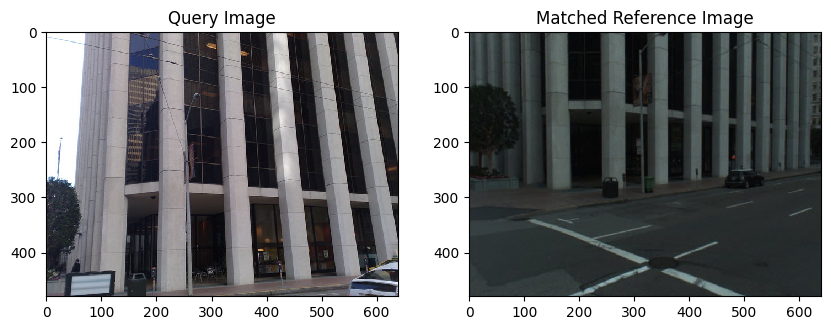

In [28]:
query_image = cv2.imread('A2_smvs/landmarks/Query/050.jpg')
image_matching(query_image, listoflandmarks,'landmarks', 30)

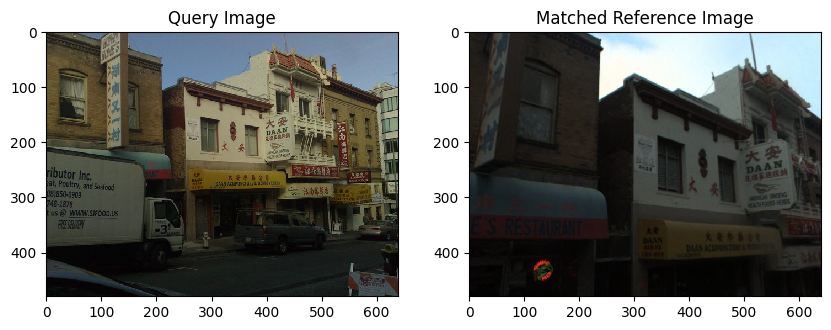

In [49]:
query_image = cv2.imread('A2_smvs/landmarks/Query/085.jpg')
image_matching(query_image, listoflandmarks,'landmarks', 30)

Failure cases

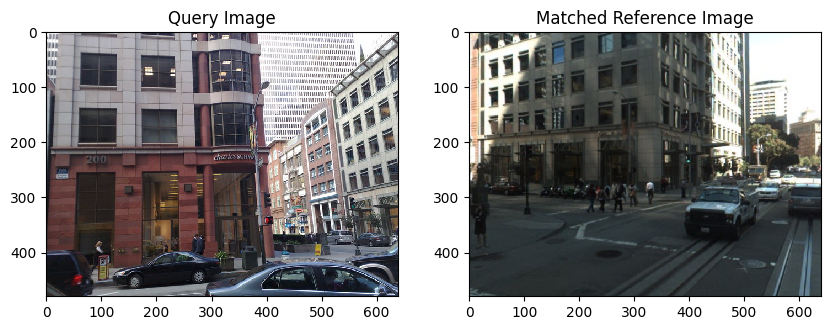

In [50]:
query_image = cv2.imread('A2_smvs/landmarks/Query/045.jpg')
image_matching(query_image, listoflandmarks,'landmarks', 30)

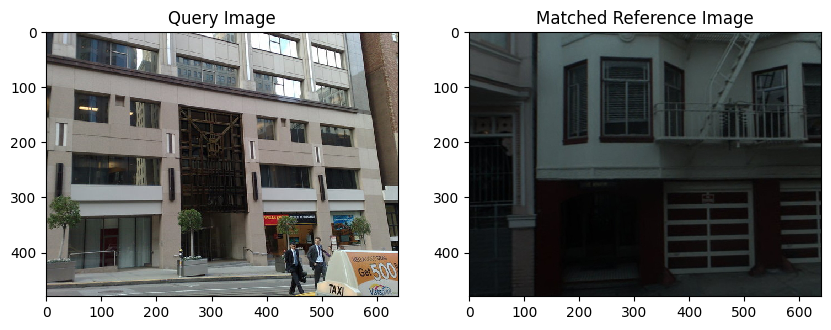

In [51]:
query_image = cv2.imread('A2_smvs/landmarks/Query/035.jpg')
image_matching(query_image, listoflandmarks,'landmarks', 30)

In [52]:
query_image = cv2.imread('A2_smvs/landmarks/Query/075.jpg')
image_matching(query_image, listoflandmarks,'landmarks', 30)

'Image is not in dataset'

#### Museum Painting Example

Success Cases

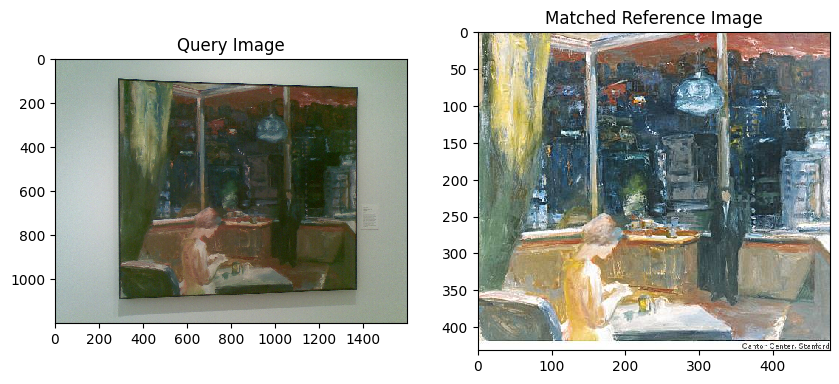

In [25]:
query_image = cv2.imread('A2_smvs/museum_paintings/Query/010.jpg')
image_matching(query_image, listofmuseumpaintings,'museum_paintings', 30)

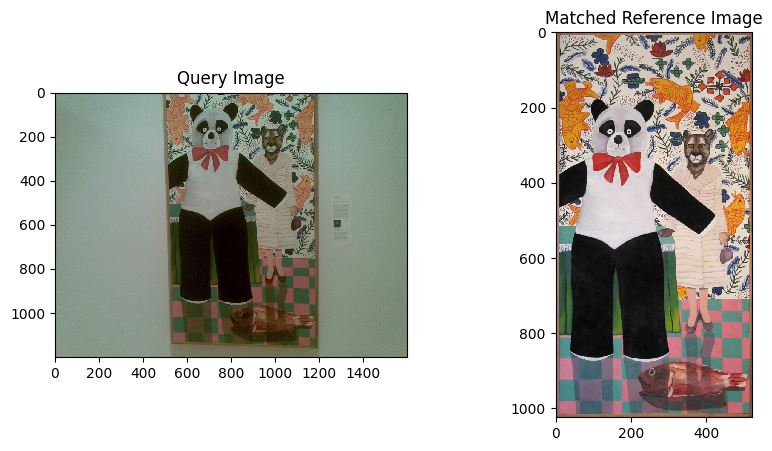

In [55]:
query_image = cv2.imread('A2_smvs/museum_paintings/Query/017.jpg')
image_matching(query_image, listofmuseumpaintings,'museum_paintings', 30)

Failure Cases

In [56]:
query_image = cv2.imread('A2_smvs/museum_paintings/Query/022.jpg')
image_matching(query_image, listofmuseumpaintings,'museum_paintings', 30)

'Image is not in dataset'

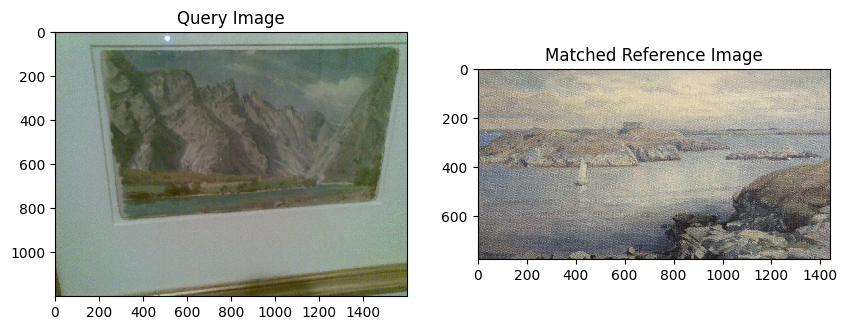

In [59]:
query_image = cv2.imread('A2_smvs/museum_paintings/Query/037.jpg')
image_matching(query_image, listofmuseumpaintings,'museum_paintings', 30)

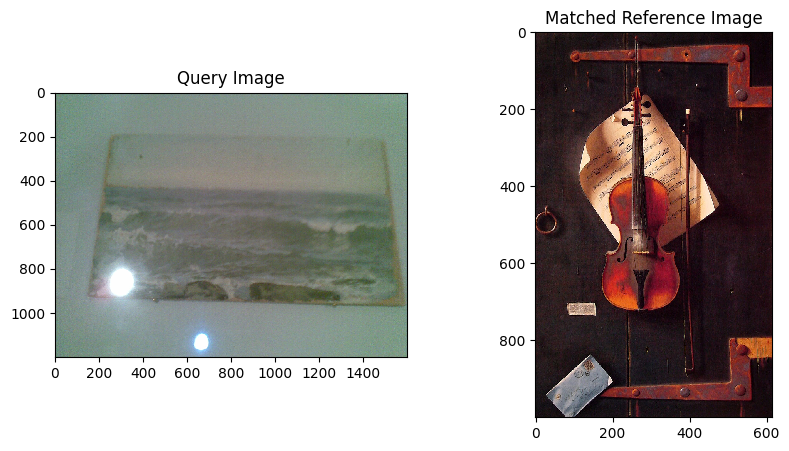

In [62]:
query_image = cv2.imread('A2_smvs/museum_paintings/Query/052.jpg')
image_matching(query_image, listofmuseumpaintings,'museum_paintings', 30)

#### Explaining the Accuracy of the Dataset

After matching the images from three categories of book_covers, landmarks and museum_paintings, we have found that the accuracy of the book covers is highest followed by museum paintings and least accuracy is for landmarks. It can happend due to increased number of features, keypoints and descriptors available in book covers due to text present in the image. Similar case goes for museum paintings as there are different colors and gradients present in the images causes number of features matching. However, the images of landmarks are more similar to each other with every image containing distinct edges both horizontal and vertical. The landmark reference images has low exposure and brightness which can also play a major role in decreased accuracy. The accuracy measured for the three categories are as follows

| Category   | Accuracy |
|-------------------|-------|
| Book Covers  | 78%   |
| Landmarks     | 32%    |
| Museum Paintings    | 67%    |

**5**. Choose some extra query images of objects that do not occur in the reference dataset. Repeat step 4 with these images added to your query set. Accuracy is now measured by the percentage of query images correctly identified in the dataset, or correctly identified as not occurring in the dataset. Report how accuracy is altered by including these queries, and any changes you have made to improve performance.

Extra Query images of book_covers, landmark and museum painting

Book Cover Image


`query_image = cv2.imread('A2_smvs/book_cover1.jpg')
image_matching(query_image, listofbookcovers,'book_covers', 30)`

In [70]:
query_image = cv2.imread('A2_smvs/book_cover1.jpg')
image_matching(query_image, listofbookcovers,'book_covers', 30)


'Image is not in dataset'

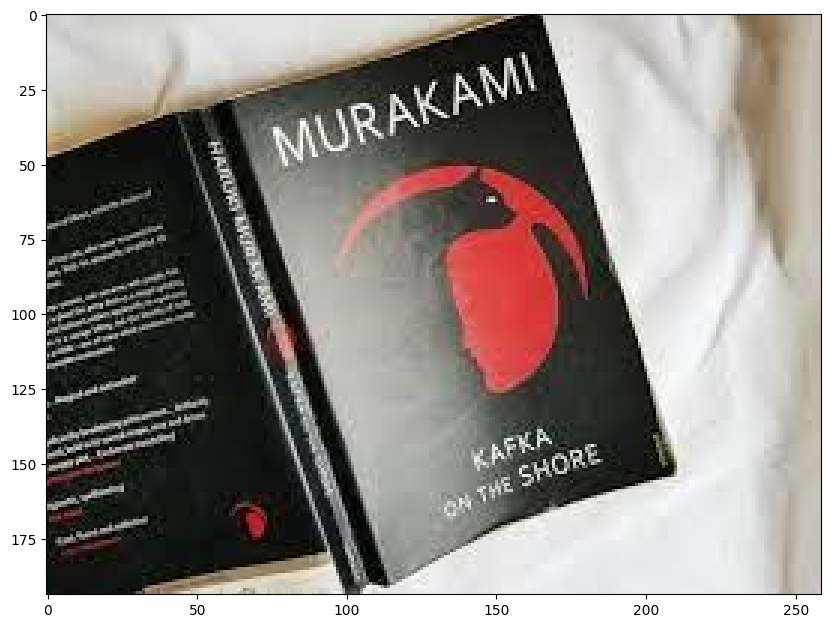

In [71]:
plt.imshow(cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB))


6. Repeat step 4 and 5 for at least one other set of reference images from museum_paintings or landmarks, and compare the accuracy obtained. Analyse both your overall result and individual image matches to diagnose where problems are occurring, and what you could do to improve performance. Test at least one of your proposed improvements and report its effect on accuracy.


Landmark Image

`query_image = cv2.imread('A2_smvs/landmark1.jpg')
image_matching(query_image, listoflandmarks,'landmarks', 30)
`

In [72]:
query_image = cv2.imread('A2_smvs/landmark1.jpg')
image_matching(query_image, listoflandmarks,'landmarks', 30)

'Image is not in dataset'

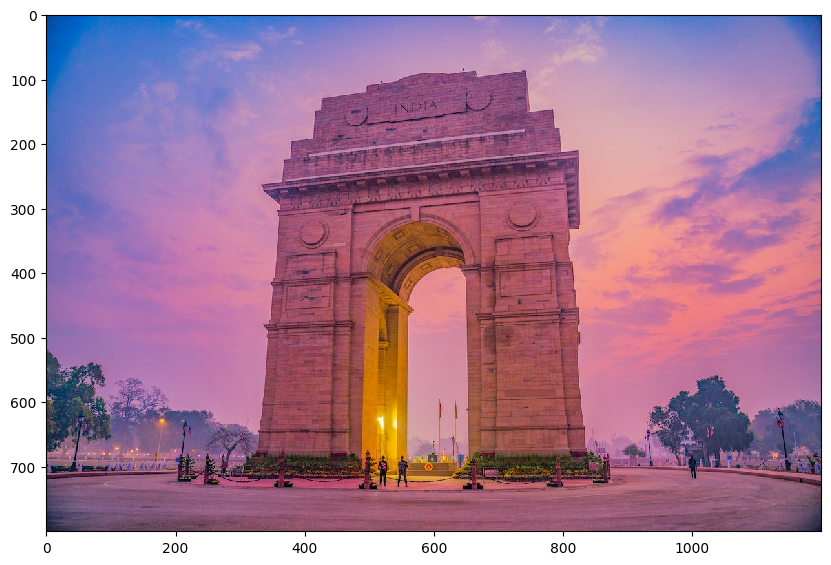

In [73]:
plt.imshow(cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB))

Museum Painting Image

`query_image = cv2.imread('A2_smvs/museum_painting1.jpg')
image_matching(query_image, listofmuseumpaintings,'museum_paintings', 30)`

In [74]:
query_image = cv2.imread('A2_smvs/museum_painting1.jpg')
image_matching(query_image, listofmuseumpaintings,'museum_paintings', 30)

'Image is not in dataset'

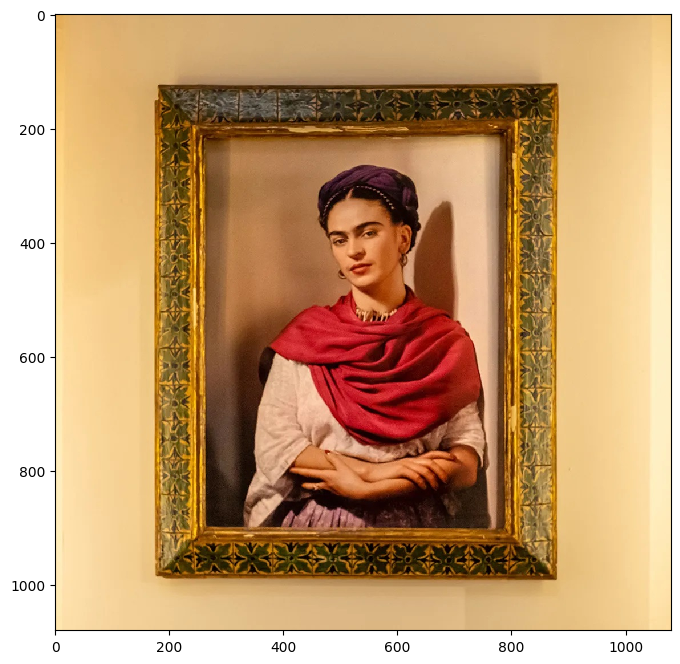

In [75]:
plt.imshow(cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB))

There are three different category of images are taken that are not in the dataset. All of the three images are classified as not in the dataset by the function. Thus, the function can clearly identify in terms of which images are not in the dataset. The accuracy of the image matching is good in terms of identifying which images are not in the dataset.

#### Methods to improve performance

The following methods can be used to improve the performance of the images:
1. Feature Extraction Techniques - we can use techniques such as SIFT (Scale-Invariant Feature Transform) or SURF (Speeded-Up Robust Features), which are designed to handle variations in scale, rotation, and lighting conditions.

2. Different Descriptor Matching Algorithms - Different algorithms have different computational complexities and matching strategies, which can impact accuracy. Algorithms such as brute force matching, FLANN (Fast Library for Approximate Nearest Neighbors) matching, or hierarchical clustering-based matching can be used.

3. Fine-tuning parameters: Experiment with different parameter settings, such as the ratio threshold for matching, distance function, or threshold inlier values used in image matching. Fine-tuning these parameters can have a significant impact on the accuracy of image matching.

4. Machine learning-based approaches - Explore machine learning techniques such as Hard-net model, deep learning-based methods or feature embedding models, to improve image matching accuracy.
